In [1]:
# reload modules before executing cells
%load_ext autoreload
%autoreload 2

In [2]:

from tqdm.notebook import tqdm
import torch
from diffusers import StableDiffusionPipeline, DDIMScheduler
from diffusers import DiffusionPipeline, UNet2DConditionModel
from transformers import CLIPTextModel

import os
import numpy as np
from PIL import Image
from pathlib import Path

In [3]:
LOW_RESOURCE = False 
NUM_DIFFUSION_STEPS = 50
GUIDANCE_SCALE = 7.5
MAX_NUM_WORDS = 77
device = torch.device('cuda:0') if torch.cuda.is_available() else torch.device('cpu')
model_id = "./logs/dog/lora"
ldm_stable = StableDiffusionPipeline.from_pretrained("CompVis/stable-diffusion-v1-4").to(device)
ldm_stable.load_lora_weights(model_id)
tokenizer = ldm_stable.tokenizer

`text_config_dict` is provided which will be used to initialize `CLIPTextConfig`. The value `text_config["id2label"]` will be overriden.


In [4]:
prompts = [
    "a <sks-dog> in the jungle",
    "a <sks-dog> in the snow", 
    "a <sks-dog> on the beach",
    "a <sks-dog> on top of a wooden floor",
    "a <sks-dog> with a mountain in the background",
    "a <sks-dog> with a city in the background",
    "a <sks-dog> with a blue house in the background",
    "a <sks-dog> wearing a red hat",
    "a <sks-dog> wearing a yellow shirt",
    "a <sks-dog> sitting near the window",
    "a <sks-dog> on top of green grass with sunflowers around it",
    "a <sks-dog> wearing a tuxedo",
    "a <sks-dog> walking on a red carpet on the beach",
    "a <sks-dog> on top of the sidewalk in a crowded city",
    "a <sks-dog> with the Taj Mahal in the background",
    "a <sks-dog> getting a bath",
    "a <sks-dog> surfing on a wave",
    "a <sks-dog> floating in space",
    "a <sks-dog> jumping in the air",
    "a <sks-dog> sleeping on a bed"
]

negative_prompt = len(prompts)*["low quality, blurry, unfinished"]

g_cpu = torch.Generator().manual_seed(0)
images = []
for i in range(2):
    images_ = ldm_stable(prompts[i*10: (i+1)*10], num_images_per_prompt=1, output_type="pil", generator = g_cpu, negative_prompt = negative_prompt[i*10: (i+1)*10]).images
    images.extend(images_)

  0%|          | 0/50 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

a <sks-dog> in the jungle


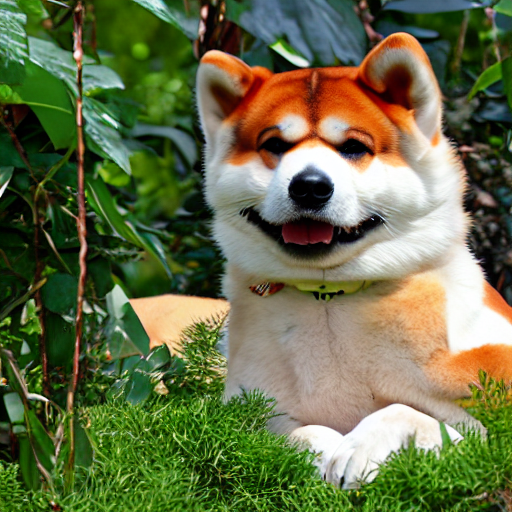

a <sks-dog> in the snow


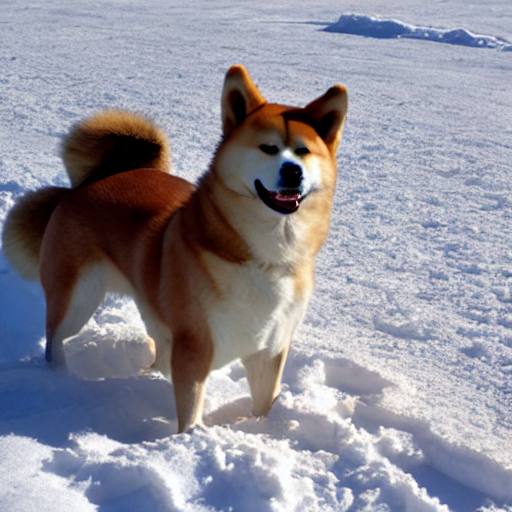

a <sks-dog> on the beach


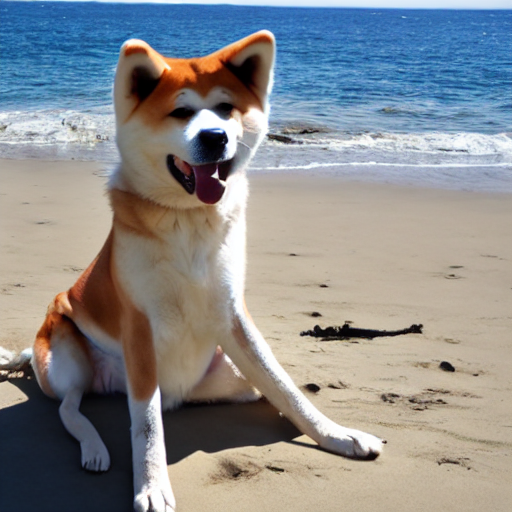

a <sks-dog> on top of a wooden floor


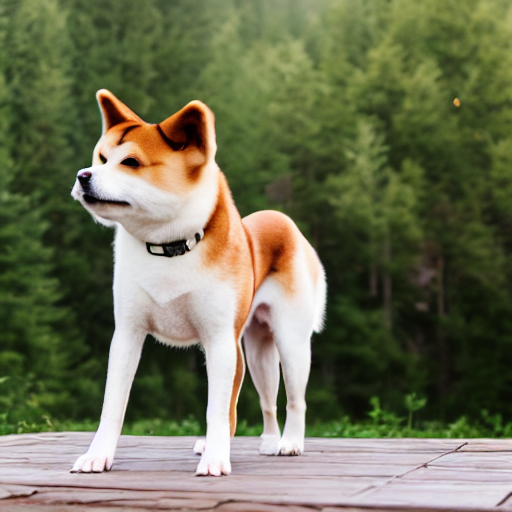

a <sks-dog> with a mountain in the background


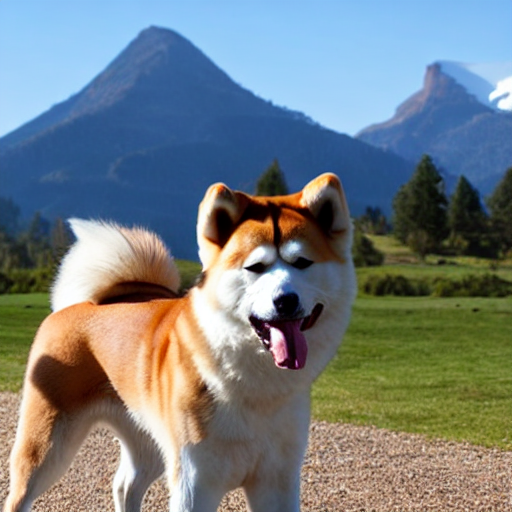

a <sks-dog> with a city in the background


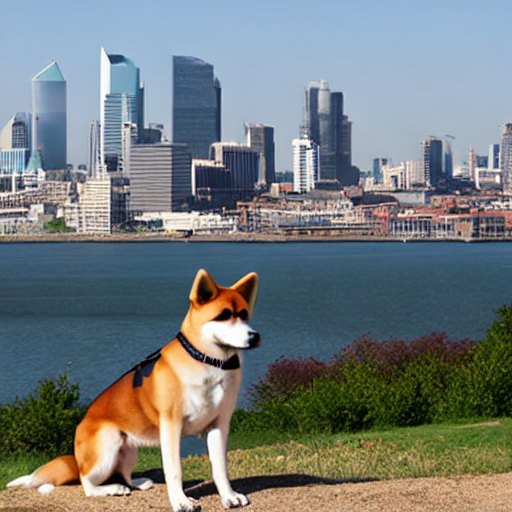

a <sks-dog> with a blue house in the background


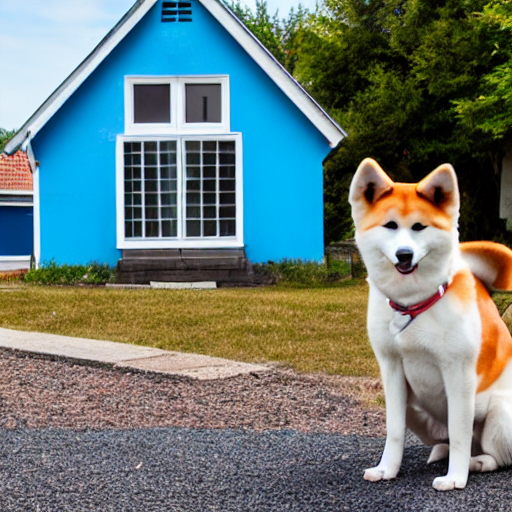

a <sks-dog> wearing a red hat


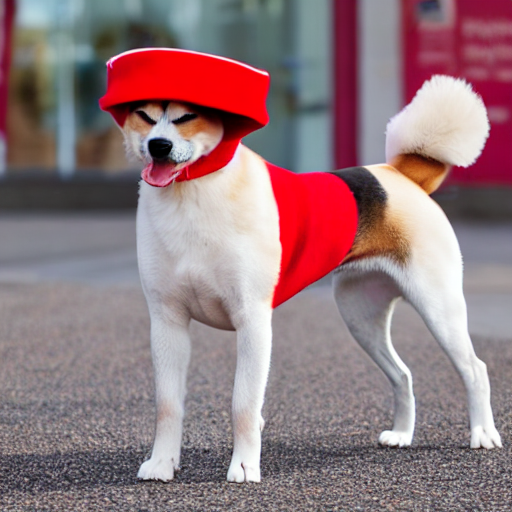

a <sks-dog> wearing a yellow shirt


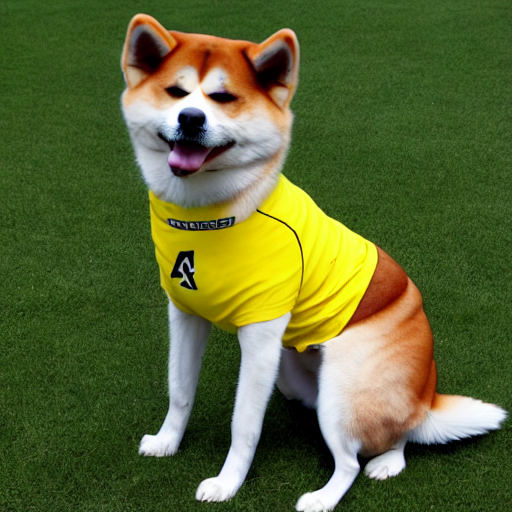

a <sks-dog> sitting near the window


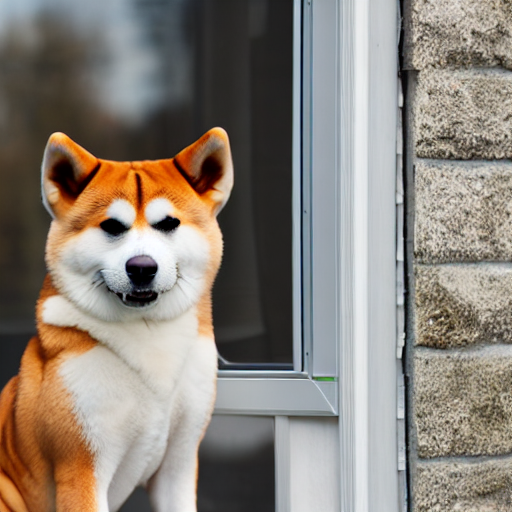

a <sks-dog> on top of green grass with sunflowers around it


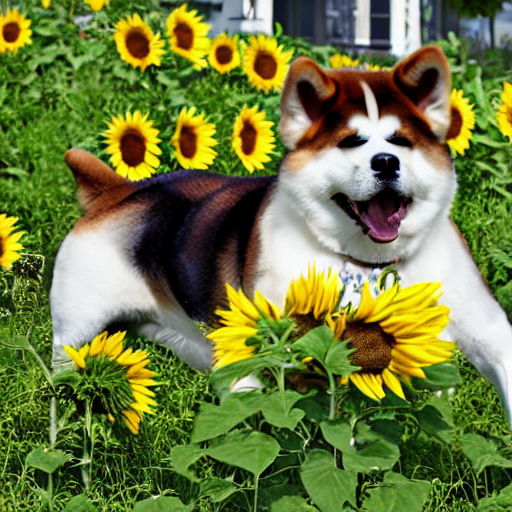

a <sks-dog> wearing a tuxedo


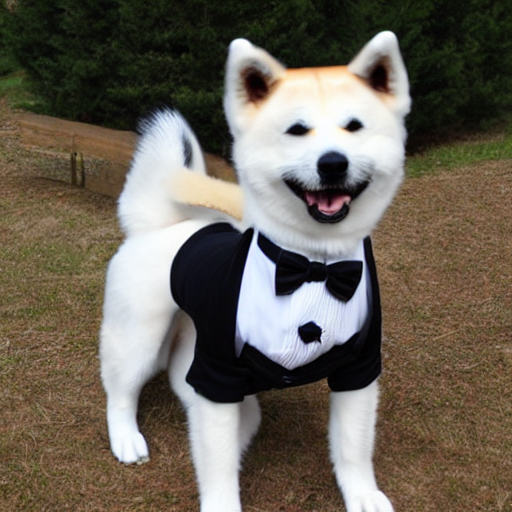

a <sks-dog> walking on a red carpet on the beach


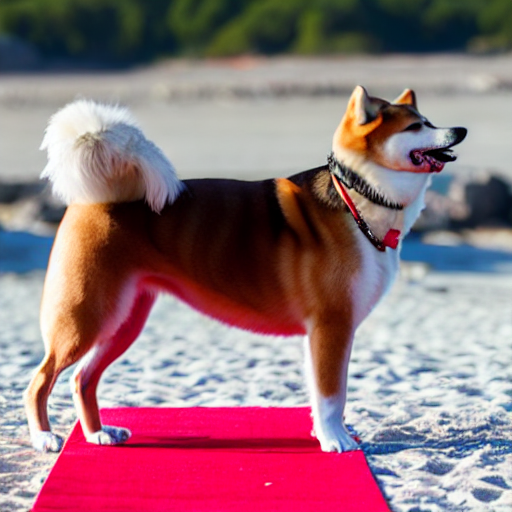

a <sks-dog> on top of the sidewalk in a crowded city


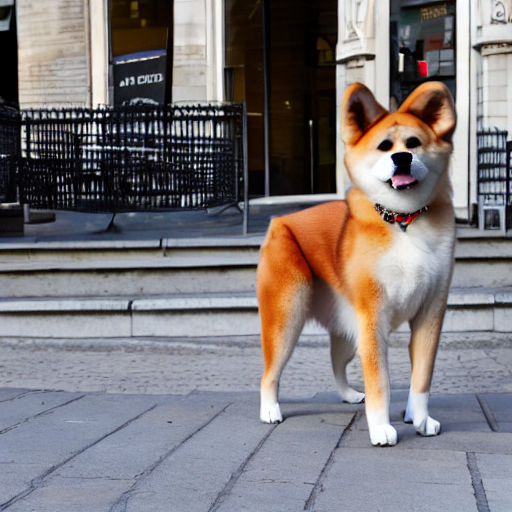

a <sks-dog> with the Taj Mahal in the background


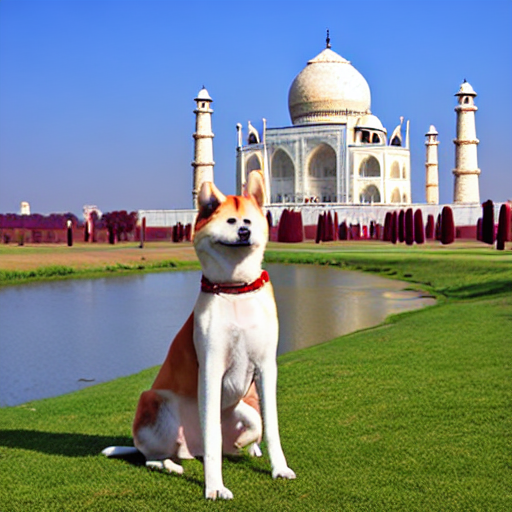

a <sks-dog> getting a bath


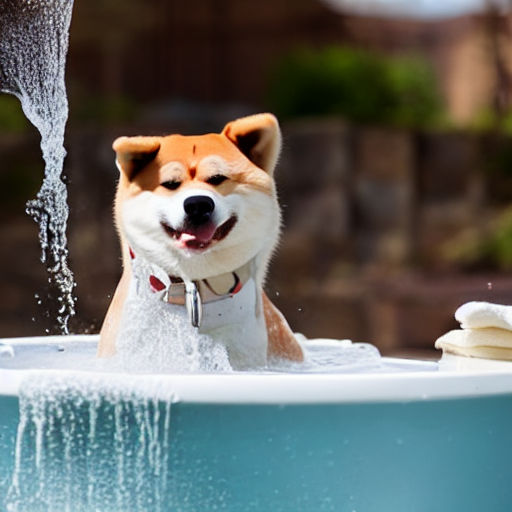

a <sks-dog> surfing on a wave


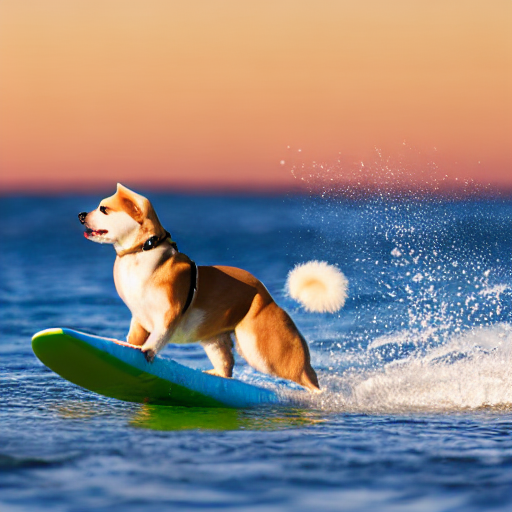

a <sks-dog> floating in space


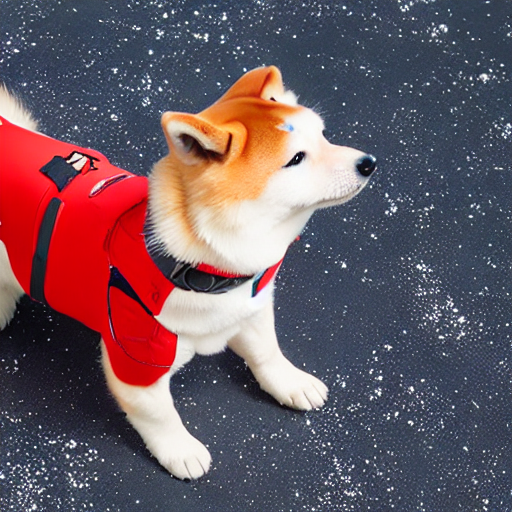

a <sks-dog> jumping in the air


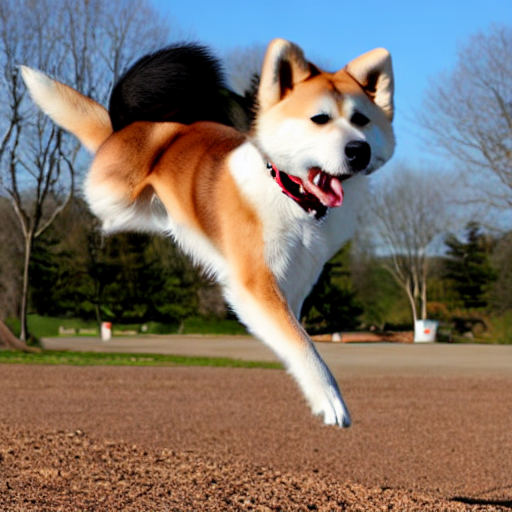

a <sks-dog> sleeping on a bed


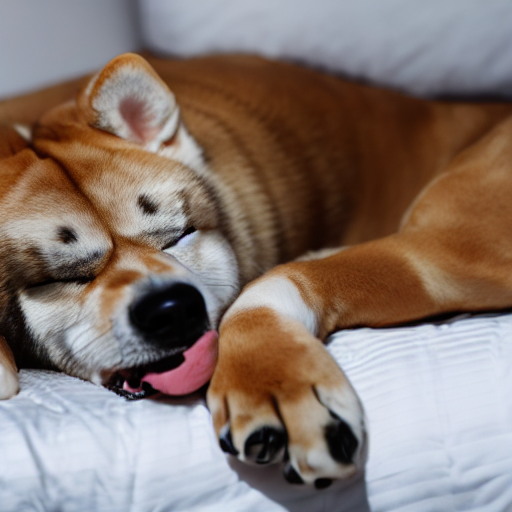

In [5]:
# plot and save pil images

save_dir = "results/dog/prior_high_lr_again"

os.makedirs(save_dir, exist_ok=True)

for prompt, image in zip(prompts, images):
    print(prompt)
    display(image)
    image.save(os.path.join(save_dir, prompt.replace(" ", "_") + ".png"))

In [6]:
from torchmetrics.functional.multimodal import clip_score
from functools import partial

clip_score_fn = partial(clip_score, model_name_or_path="openai/clip-vit-base-patch16")


def calculate_clip_score(images, prompts):
    images_int = (images * 255).astype("uint8")
    clip_score = clip_score_fn(torch.from_numpy(images_int).permute(0, 3, 1, 2), prompts).detach()
    return round(float(clip_score), 4)

images_np =[np.array(image) for image in images]
images_np = np.array(images_np)
sd_clip_score = calculate_clip_score(images_np, prompts)
print(f"CLIP score: {sd_clip_score}")

CLIP score: 30.1661


In [9]:
import torchvision

dataset_path = "data/dog"

# resize to 512x512
# get images of only class 0




In [11]:
# get dataset images of class original

get_class = "original"


(<PIL.Image.Image image mode=RGB size=1080x1350>, 0)

In [12]:
dataset_images.classes

['original', 'regularise']

In [ ]:

from pathlib import Path
from torchvision import transforms
from torch.utils.data import Dataset

class DreamBoothDataset(Dataset):
    def __init__(
        self,
        instance_data_root,
        instance_prompt,
        tokenizer,
        class_data_root=None,
        class_prompt=None,
        size=512,
        center_crop=False,
    ):
        self.size = size
        self.center_crop = center_crop
        self.tokenizer = tokenizer

        self.instance_data_root = Path(instance_data_root)
        if not self.instance_data_root.exists():
            raise ValueError("Instance images root doesn't exists.")

        self.instance_images_path = list(Path(instance_data_root).iterdir())
        self.num_instance_images = len(self.instance_images_path)
        self.instance_prompt = instance_prompt
        self._length = self.num_instance_images

        if class_data_root is not None:
            self.class_data_root = Path(class_data_root)
            self.class_data_root.mkdir(parents=True, exist_ok=True)
            self.class_images_path = list(Path(class_data_root).iterdir())
            self.num_class_images = len(self.class_images_path)
            self._length = max(self.num_class_images, self.num_instance_images)
            self.class_prompt = class_prompt
        else:
            self.class_data_root = None

        self.image_transforms = transforms.Compose(
            [
                transforms.Resize(size, interpolation=transforms.InterpolationMode.BILINEAR),
                transforms.CenterCrop(size) if center_crop else transforms.RandomCrop(size),
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

    def __len__(self):
        return self._length

    def __getitem__(self, index):
        example = {}
        instance_image = Image.open(self.instance_images_path[index % self.num_instance_images])
        if not instance_image.mode == "RGB":
            instance_image = instance_image.convert("RGB")
        example["instance_images"] = self.image_transforms(instance_image)
        example["instance_prompt_ids"] = self.tokenizer(
            self.instance_prompt,
            padding="do_not_pad",
            truncation=True,
            max_length=self.tokenizer.model_max_length,
        ).input_ids

        if self.class_data_root:
            class_image = Image.open(self.class_images_path[index % self.num_class_images])
            if not class_image.mode == "RGB":
                class_image = class_image.convert("RGB")
            example["class_images"] = self.image_transforms(class_image)
            example["class_prompt_ids"] = self.tokenizer(
                self.class_prompt,
                padding="do_not_pad",
                truncation=True,
                max_length=self.tokenizer.model_max_length,
            ).input_ids
        
        return example


class PromptDataset(Dataset):
    def __init__(self, prompt, num_samples):
        self.prompt = prompt
        self.num_samples = num_samples

    def __len__(self):
        return self.num_samples

    def __getitem__(self, index):
        example = {}
        example["prompt"] = self.prompt
        example["index"] = index
        return example

In [ ]:
instance_data_dir = "data/data/original"
instance_prompt = "a photo of <sks-dog>"

train_dataset = DreamBoothDataset(
    instance_data_root=instance_data_dir,
    instance_prompt=instance_prompt,
    class_data_root=None,
    class_prompt=None,
    tokenizer=tokenizer,
    size=512,
    center_crop=True,
)